# Exploring Copernicus Global Land Data in openEO

This notebook explores Copernicus global land data available in openEO.

This assumes that you have openEO credentials configured in your environment:
https://open-eo.github.io/openeo-python-client/auth.html#config-files-and-openeo-auth-helper-tool

In [20]:
import openeo
session = openeo.connect("https://openeo-dev.vito.be").authenticate_oidc("egi")

Authenticated using refresh token.


In [8]:
session.describe_collection("CGLS_LAI300_V1_GLOBAL")

{'cube:dimensions': {'bands': {'type': 'bands', 'values': ['lai']},
  't': {'extent': ['2014-01-01T00:00:00Z', None], 'type': 'temporal'},
  'x': {'axis': 'x', 'extent': [-180, 180], 'type': 'spatial'},
  'y': {'axis': 'y', 'extent': [-56, 83], 'type': 'spatial'}},
 'description': 'Global LAI at 300m resolution, 10-daily. The Leaf Area Index is defined as half the total area of green elements of the canopy per unit horizontal ground area. The satellite-derived value corresponds to the total green LAI of all the canopy layers, including the understory which may represent a very significant contribution, particularly for forests. Practically, the LAI quantifies the thickness of the vegetation cover.',
 'extent': {'spatial': {'bbox': [[-180, -56, 180, 83]]},
  'temporal': {'interval': [['2014-01-01T00:00:00Z', None]]}},
 'id': 'CGLS_LAI300_V1_GLOBAL',
 'license': 'free',
 'links': [{'href': 'https://land.copernicus.eu/global/products/lai',
   'rel': 'alternate',
   'title': 'Product web page.'}],
 'name': 'CGLS_LAI300_V1_GLOBAL',
 'product_id': 'CGLS_LAI300_V1_GLOBAL',
 'stac_extensions': ['datacube'],
 'stac_version': '0.9.0',
 'summaries': {},
 'title': 'Copernicus Global Land LAI product V2, 300m resolution, 10-daily'}

In [21]:
LAI300 = session.load_collection("CGLS_LAI300_V1_GLOBAL")

## Downloading data

Downloading data for an area of interest is rather simple.
In this example, we export to NetCDF, allowing us to uses xarray for further analysis.

In [11]:
%time LAI300.filter_temporal("2019-08-10","2019-08-30").filter_bbox([3.889160,43.984910,14.370117,47.587642]).download("LAI.nc",format="NetCDF")

CPU times: user 361 ms, sys: 128 ms, total: 489 ms
Wall time: 30.2 s


In [12]:
import xarray as xr
lai = xr.open_dataset('LAI.nc',engine="h5netcdf")

In [13]:
import hvplot.xarray
lai.hvplot.hist(dynamic=False)

:NdOverlay   [Element]
   :Histogram   [lai]   (lai_count)

In [14]:
lai.t

<xarray.DataArray 't' (t: 2)>
array(['2019-08-10T00:00:00.000000000', '2019-08-20T00:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
    spatial_ref  int64 ...
  * t            (t) datetime64[ns] 2019-08-10 2019-08-20

In [15]:
import holoviews as hv
lai.sel(t="2019-08-10").hvplot(cmap='RdYlGn',dynamic=False,width=1300,height=1300)

:Image   [y,x]   (lai)

## Timeseries analysis

The great thing about the Copernicus Global land layers, is having a longer timeseries of data. So let's show how to extract a timeseries for further analysis.

In [22]:
from shapely.geometry import Polygon
polygon = Polygon([[
              5.001010894775391,
              51.04873280131447
            ],
            [
              5.012340545654297,
              51.03113907175533
            ],
            [
              5.039806365966797,
              51.033837930308316
            ],
            [
              5.026073455810547,
              51.05402040784723
            ],
            [
              5.001010894775391,
              51.04873280131447
            ]])
%time ts = LAI300.polygonal_mean_timeseries(polygon).execute()

CPU times: user 136 ms, sys: 19.7 ms, total: 156 ms
Wall time: 41.9 s


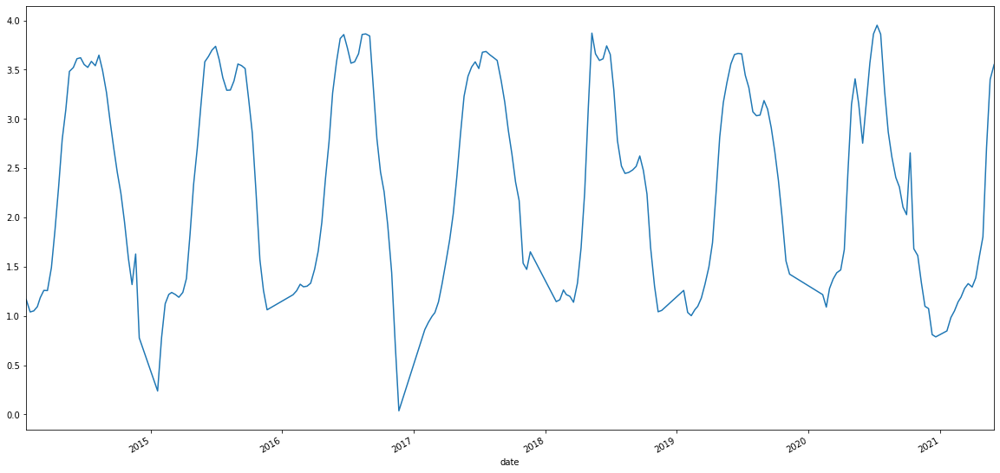

In [23]:
%matplotlib inline
from openeo.rest.conversions import timeseries_json_to_pandas
import matplotlib.pyplot as plt
import pandas as pd
lai_ts = timeseries_json_to_pandas(ts)
lai_ts.index = pd.to_datetime(lai_ts.index)
lai_ts = lai_ts/30.0
plt.figure(figsize=(20,10))
lai_ts.dropna().plot()